## Dataset
This section loads the dataset and creates column sets and media definitions.

In [1]:
import warnings

import arviz as az
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import seaborn as sns

from pymc_marketing.metrics import crps
from pymc_marketing.mmm import MMM, GeometricAdstock, LogisticSaturation
from pymc_marketing.mmm.utils import apply_sklearn_transformer_across_dim
from pymc_marketing.prior import Prior

warnings.filterwarnings("ignore", category=FutureWarning)

az.style.use("arviz-darkgrid")
plt.rcParams["figure.figsize"] = [12, 7]
plt.rcParams["figure.dpi"] = 100

%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format = "retina"

seed: int = sum(map(ord, "mmm"))
rng: np.random.Generator = np.random.default_rng(seed=seed)

In [2]:
from mediamix.datasets import load_he_mmm_dataset
data = load_he_mmm_dataset()

In [3]:
data

,week_start,sales,radio,direct_mail,insert,newspaper,online_display,social,tv,hldy_black_friday,...,hldy_memorial_day,hldy_mother's_day,hldy_nye,hldy_new_year's_day,hldy_pre_thanksgiving,hldy_presidents_day,hldy_prime_day,hldy_thanksgiving,hldy_valentine's_day,hldy_veterans_day
0,2014-08-03,7.205146e+07,254134.14,678410.26,129759.66,507635.16,61364.75,0.00,216725.59,0,...,0,0,0,0,0,0,0,0,0,0
1,2014-08-10,7.879477e+07,106602.98,661097.71,70355.33,625719.37,132643.90,0.00,108919.26,0,...,0,0,0,0,0,0,0,0,0,0
2,2014-08-17,7.007119e+07,59011.42,1874338.43,107720.37,277532.61,76741.27,0.00,74032.19,0,...,0,0,0,0,0,0,0,0,0,0
3,2014-08-24,6.864246e+07,178010.46,306583.37,141708.61,186028.61,193043.55,0.00,110995.66,0,...,0,0,0,0,0,0,0,0,0,0
4,2014-08-31,8.619078e+07,144097.56,2366274.16,160691.30,706694.09,249612.89,0.00,225140.84,0,...,0,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
204,2018-07-01,6.671739e+07,81629.95,9240.93,40228.70,247.54,367134.78,127450.10,106915.43,0,...,0,0,0,0,0,0,0,0,0,0
205,2018-07-08,1.174300e+08,108353.11,0.00,31610.68,0.00,229922.46,51395.55,38880.62,0,...,0,0,0,0,0,0,1,0,0,0
206,2018-07-15,6.403861e+07,138260.98,468700.11,44601.61,0.00,147652.74,123897.22,58461.70,0,...,0,0,0,0,0,0,0,0,0,0
207,2018-07-22,5.356965e+07,67235.71,696181.94,15339.78,564.40,143210.12,136457.71,13895.66,0,...,0,0,0,0,0,0,0,0,0,0


In [2]:
raw_df = pd.read_csv("https://raw.githubusercontent.com/sibylhe/mmm_stan/main/data.csv")

# 1. control variables
# We just keep the holidays columns
control_columns = [col for col in raw_df.columns if "hldy_" in col] +


# 2. media variables
channel_columns_raw = sorted(
    [
        col
        for col in raw_df.columns
        if "mdsp_" in col
        and col != "mdsp_viddig"
        and col != "mdsp_auddig"
        and col != "mdsp_sem"
    ]
)


channel_mapping = {
    "mdsp_dm": "Direct Mail",
    "mdsp_inst": "Insert",
    "mdsp_nsp": "Newspaper",
    "mdsp_audtr": "Radio",
    "mdsp_vidtr": "TV",
    "mdsp_so": "Social Media",
    "mdsp_on": "Online Display",
}

channel_columns = sorted(list(channel_mapping.values()))

# 3. sales variables
sales_col = "sales"

data_df = raw_df[["wk_strt_dt", sales_col, *channel_columns_raw, *control_columns]]
data_df = data_df.rename(columns=channel_mapping)


# 4. Date column
data_df["wk_strt_dt"] = pd.to_datetime(data_df["wk_strt_dt"])
date_column = "wk_strt_dt"

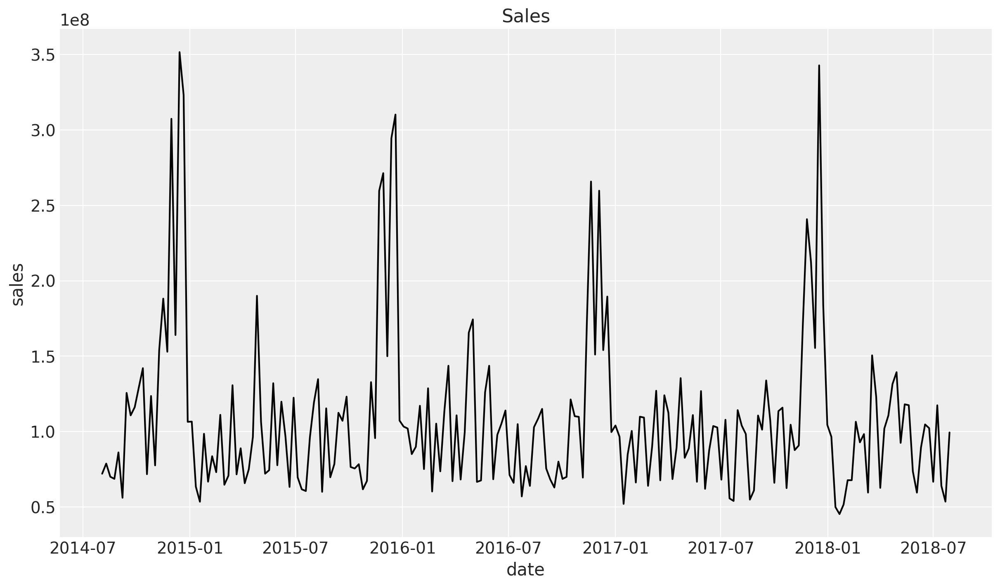

In [4]:
fig, ax = plt.subplots()
sns.lineplot(data=data_df, x=date_column, y="sales", color="black", ax=ax)
ax.set(title="Sales", xlabel="date", ylabel="sales");

[Text(0.5, 1.0, 'Total Media Spend'),
 Text(0.5, 0, 'Spend'),
 Text(0, 0.5, 'Channel')]

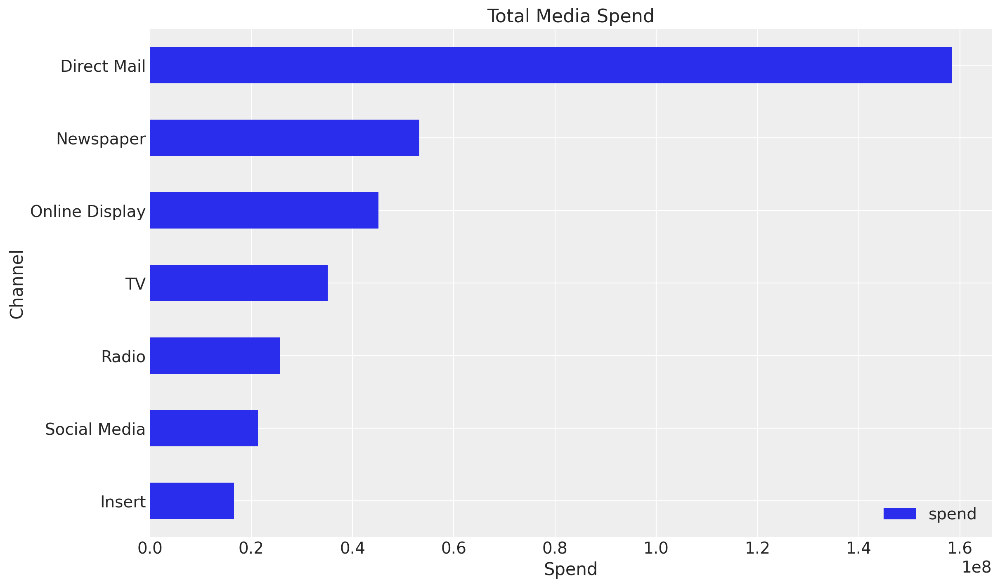

In [5]:
fig, ax = plt.subplots()
data_df.melt(
    value_vars=channel_columns, var_name="channel", value_name="spend"
).groupby("channel").agg({"spend": "sum"}).sort_values(by="spend").plot.barh(ax=ax)
ax.set(title="Total Media Spend", xlabel="Spend", ylabel="Channel")

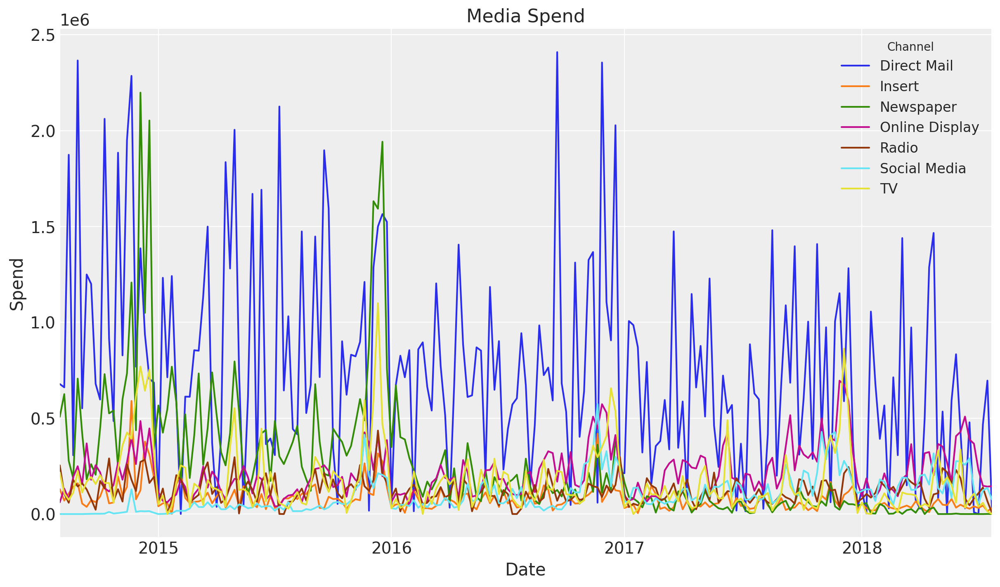

In [6]:
fig, ax = plt.subplots()
data_df.set_index("wk_strt_dt")[channel_columns].plot(ax=ax)
ax.legend(title="Channel", fontsize=12)
ax.set(title="Media Spend", xlabel="Date", ylabel="Spend");

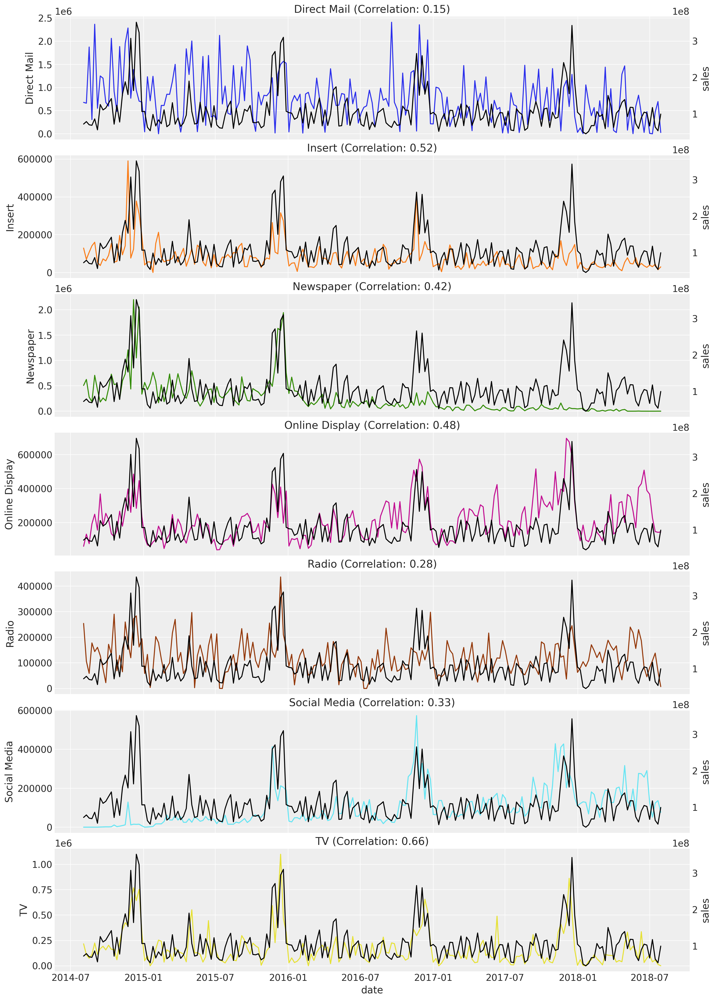

In [7]:
n_channels = len(channel_columns)

fig, axes = plt.subplots(
    nrows=n_channels,
    ncols=1,
    figsize=(15, 3 * n_channels),
    sharex=True,
    sharey=False,
    layout="constrained",
)

for i, channel in enumerate(channel_columns):
    ax = axes[i]
    ax_twin = ax.twinx()
    sns.lineplot(data=data_df, x=date_column, y=channel, color=f"C{i}", ax=ax)
    sns.lineplot(data=data_df, x=date_column, y=sales_col, color="black", ax=ax_twin)
    correlation = data_df[[channel, sales_col]].corr().iloc[0, 1]
    ax_twin.grid(None)
    ax.set(title=f"{channel} (Correlation: {correlation:.2f})")

ax.set_xlabel("date");

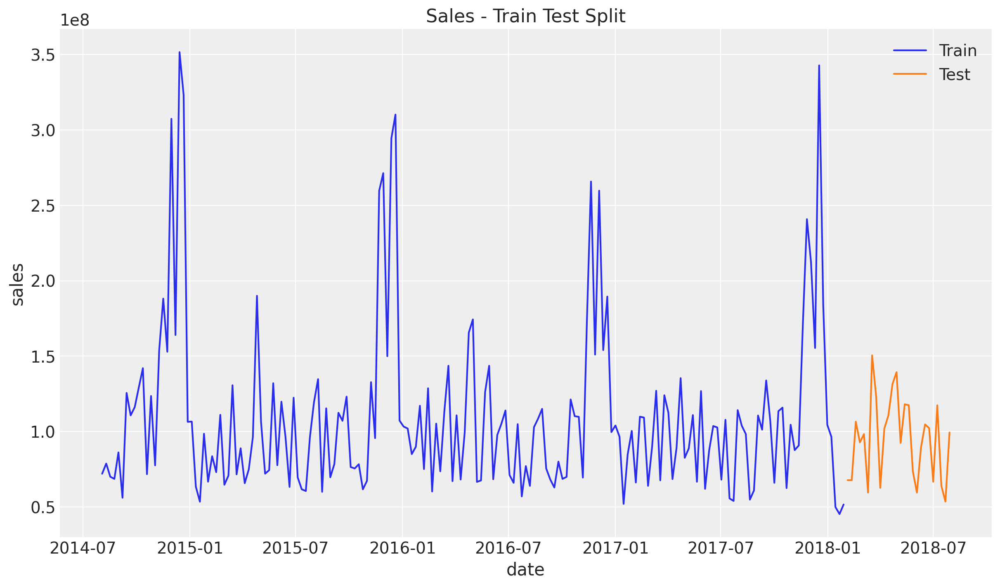

In [8]:
train_test_split_date = pd.to_datetime("2018-02-01")

train_mask = data_df.wk_strt_dt <= train_test_split_date
test_mask = data_df.wk_strt_dt > train_test_split_date

train_df = data_df[train_mask]
test_df = data_df[test_mask]

fig, ax = plt.subplots()
sns.lineplot(data=train_df, x="wk_strt_dt", y="sales", color="C0", label="Train", ax=ax)
sns.lineplot(data=test_df, x="wk_strt_dt", y="sales", color="C1", label="Test", ax=ax)
ax.set(title="Sales - Train Test Split", xlabel="date");

In [9]:
X_train = train_df.drop(columns=sales_col)
X_test = test_df.drop(columns=sales_col)

y_train = train_df[sales_col]
y_test = test_df[sales_col]

In [10]:
spend_shares = (
    X_train.melt(value_vars=channel_columns, var_name="channel", value_name="spend")
    .groupby("channel", as_index=False)
    .agg({"spend": "sum"})
    .sort_values(by="channel")
    .assign(spend_share=lambda x: x["spend"] / x["spend"].sum())["spend_share"]
    .to_numpy()
)

prior_sigma = spend_shares

In [28]:
prior_sigma

array([0.44983506, 0.04780756, 0.16278453, 0.11876576, 0.06840006,
       0.05234825, 0.10005879])

In [11]:
model_config = {
    "intercept": Prior("Normal", mu=0.2, sigma=0.05),
    "saturation_beta": Prior("HalfNormal", sigma=prior_sigma, dims="channel"),
    "saturation_lam": Prior("Gamma", alpha=3, beta=1, dims="channel"),
    "gamma_control": Prior("Normal", mu=0, sigma=1),
    "gamma_fourier": Prior("Laplace", mu=0, b=1),
    "likelihood": Prior("TruncatedNormal", lower=0, sigma=Prior("HalfNormal", sigma=1)),
}

In [12]:
sampler_config = {"progressbar": True}

mmm = MMM(
    model_config=model_config,
    sampler_config=sampler_config,
    date_column=date_column,
    adstock=GeometricAdstock(l_max=6),
    saturation=LogisticSaturation(),
    channel_columns=channel_columns,
    control_columns=control_columns,
    yearly_seasonality=5,
)

Sampling: [adstock_alpha, gamma_control, gamma_fourier, intercept, saturation_beta, saturation_lam, y, y_sigma]


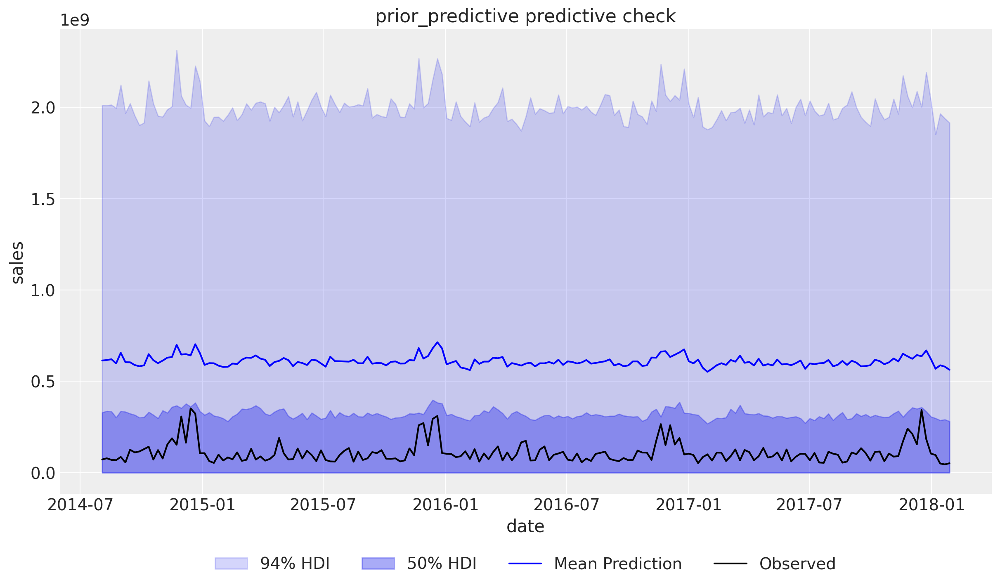

In [13]:
# Generate prior predictive samples
mmm.sample_prior_predictive(X_train, y_train, samples=2_000)
fig, ax = plt.subplots()
fig = mmm.plot_prior_predictive(original_scale=True, ax=ax)
ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.2), ncol=4)
ax.set(xlabel="date", ylabel="sales");

Text(0.5, 0.98, 'Channel Contribution Share')

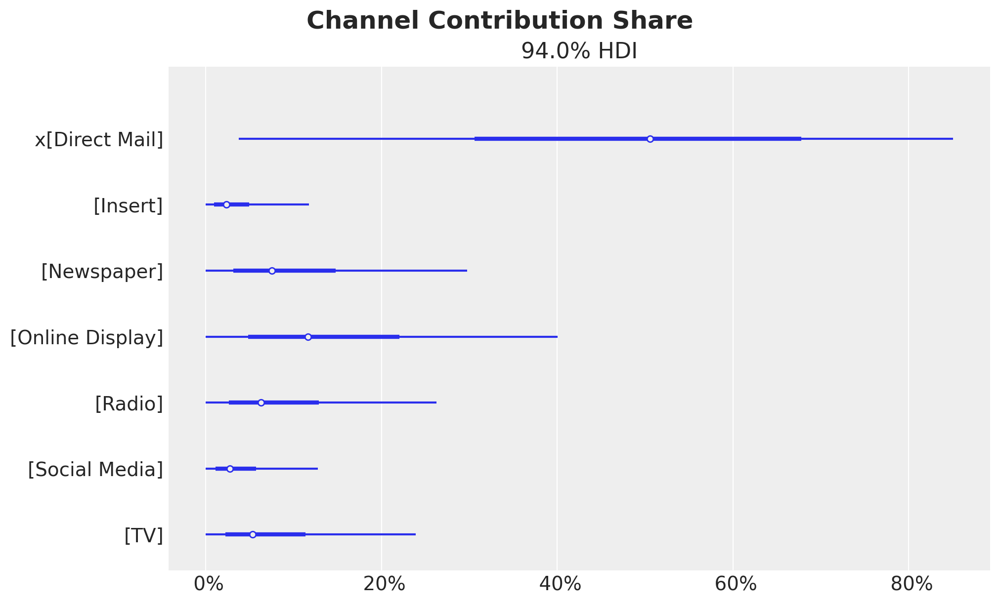

In [15]:
fig = mmm.plot_channel_contribution_share_hdi(prior=True, figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold")

In [16]:
mmm.fit(
    X=X_train,
    y=y_train,
    target_accept=0.8,
    chains=3,
    draws=2000,
    nuts_sampler="pymc",
    random_seed=rng,
)

Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [intercept, adstock_alpha, saturation_lam, saturation_beta, gamma_control, gamma_fourier, y_sigma]


Output()

Sampling 3 chains for 1_000 tune and 2_000 draw iterations (3_000 + 6_000 draws total) took 42 seconds.
We recommend running at least 4 chains for robust computation of convergence diagnostics


Inference data with groups:
	> posterior
	> sample_stats
	> prior
	> prior_predictive
	> observed_data
	> constant_data
	> fit_data

In [17]:
az.summary(
    data=mmm.idata,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
)["r_hat"].describe()

count    55.0
mean      1.0
std       0.0
min       1.0
25%       1.0
50%       1.0
75%       1.0
max       1.0
Name: r_hat, dtype: float64

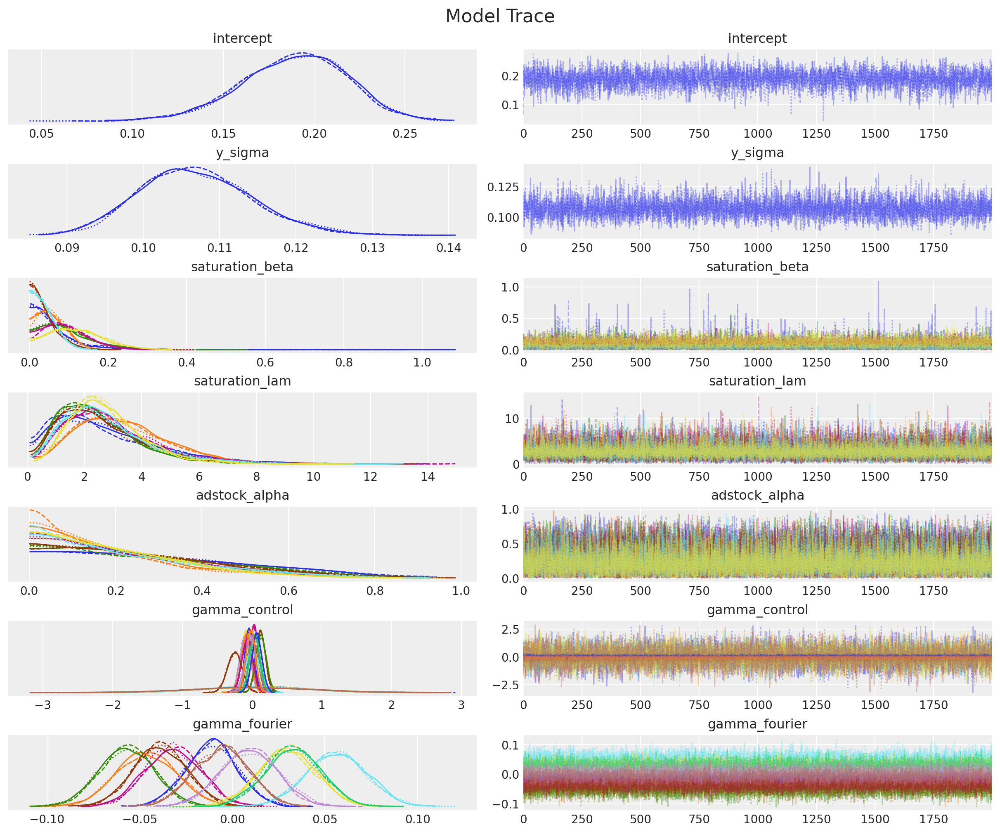

In [18]:
_ = az.plot_trace(
    data=mmm.fit_result,
    var_names=[
        "intercept",
        "y_sigma",
        "saturation_beta",
        "saturation_lam",
        "adstock_alpha",
        "gamma_control",
        "gamma_fourier",
    ],
    compact=True,
    backend_kwargs={"figsize": (12, 10), "layout": "constrained"},
)
plt.gcf().suptitle("Model Trace", fontsize=16)

Sampling: [y]


Output()

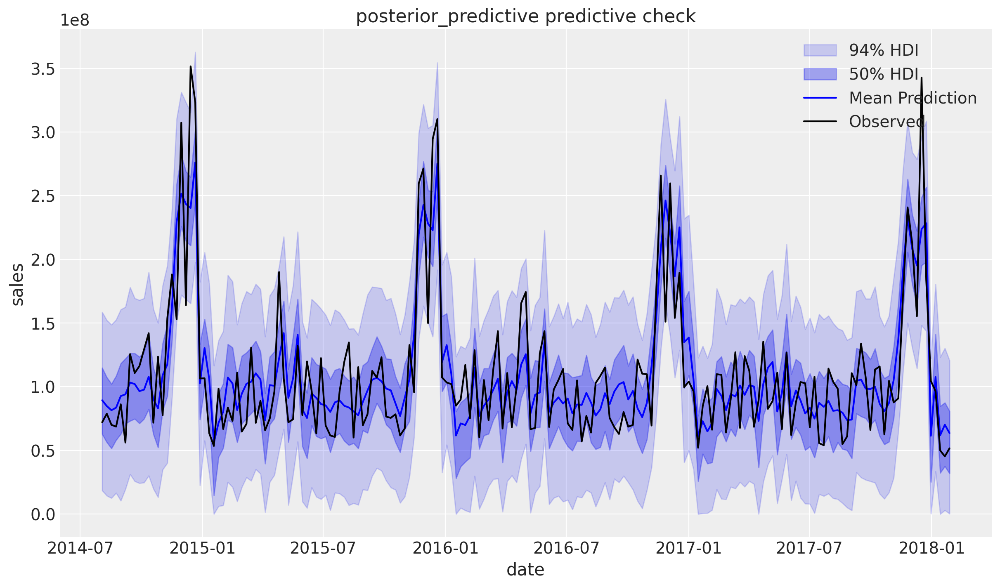

In [19]:
mmm.sample_posterior_predictive(X_train, extend_idata=True, combined=True)
fig = mmm.plot_posterior_predictive(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

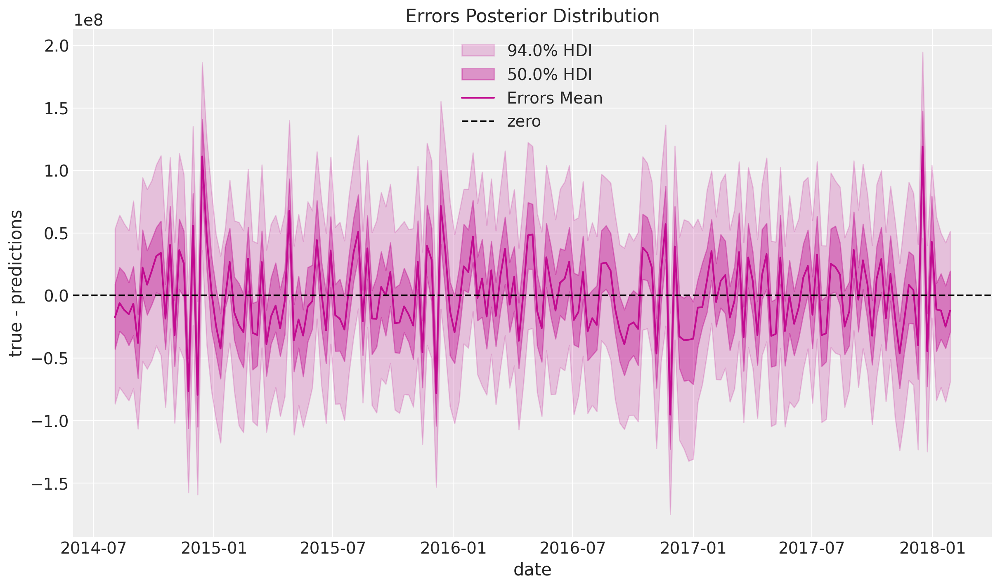

In [20]:
mmm.plot_errors(original_scale=True);

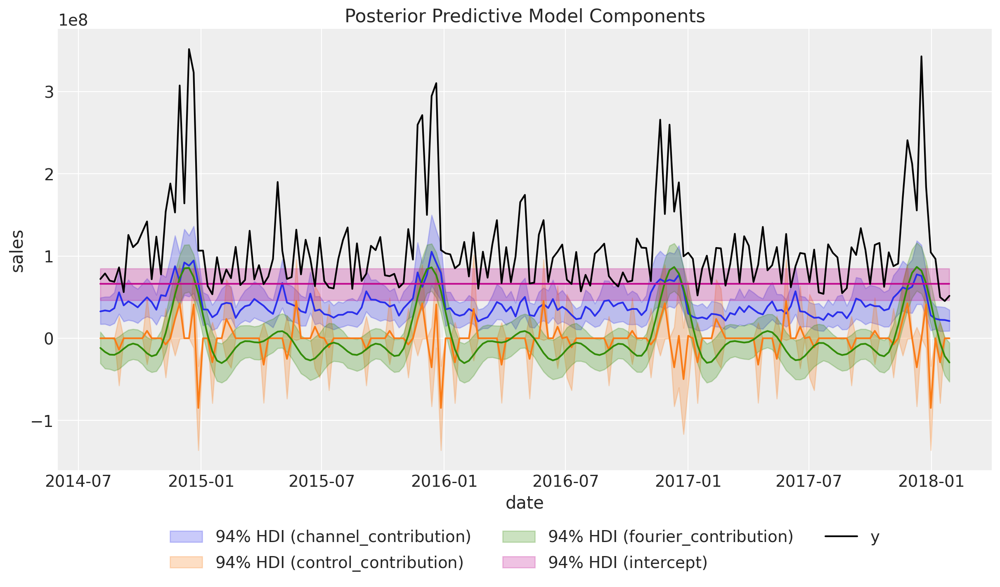

In [21]:
fig = mmm.plot_components_contributions(original_scale=True)
fig.gca().set(xlabel="date", ylabel="sales");

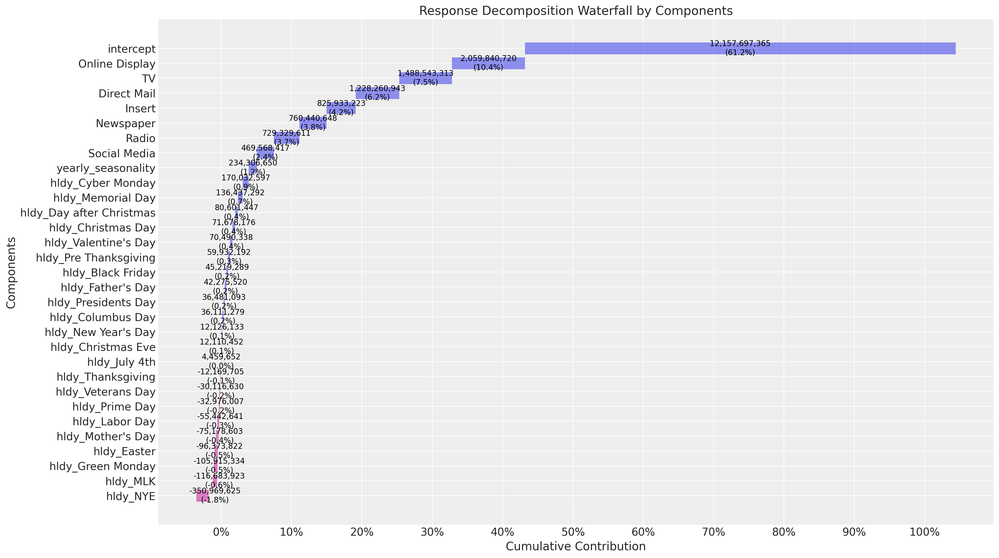

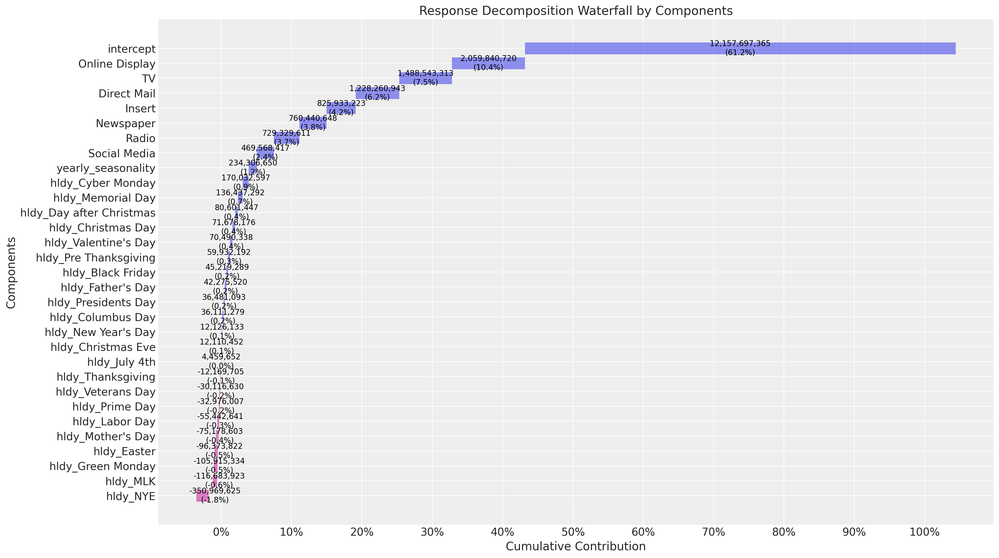

In [23]:
mmm.plot_waterfall_components_decomposition(figsize=(18, 10))

[[Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')],
 [Text(0.5, 0, 'spend')]]

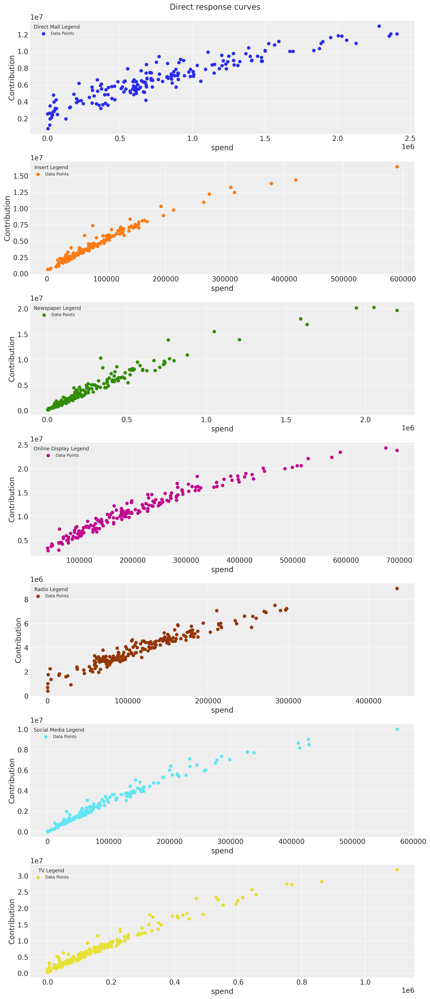

In [27]:
fig = mmm.plot_direct_contribution_curves()
[ax.set(xlabel="spend") for ax in fig.axes]

[autoreload of cutils_ext failed: Traceback (most recent call last):
  File "/Users/scott.mckean/Repos/media-mix-modeling/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 276, in check
    superreload(m, reload, self.old_objects)
  File "/Users/scott.mckean/Repos/media-mix-modeling/.venv/lib/python3.12/site-packages/IPython/extensions/autoreload.py", line 475, in superreload
    module = reload(module)
             ^^^^^^^^^^^^^^
  File "/opt/homebrew/Cellar/python@3.12/3.12.9/Frameworks/Python.framework/Versions/3.12/lib/python3.12/importlib/__init__.py", line 130, in reload
    raise ModuleNotFoundError(f"spec not found for the module {name!r}", name=name)
ModuleNotFoundError: spec not found for the module 'cutils_ext'
]


Text(0.5, 0.98, 'Channel Contribution Share')

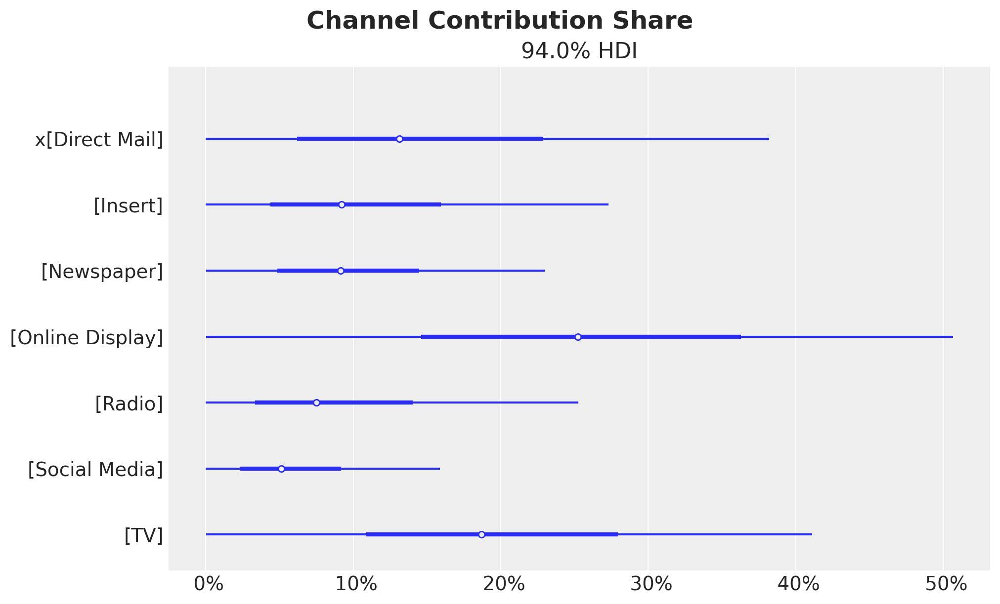

In [29]:
fig = mmm.plot_channel_contribution_share_hdi(figsize=(10, 6))
fig.suptitle("Channel Contribution Share", fontsize=18, fontweight="bold")

Text(0.5, 0.98, 'Return on Ads Spend (ROAS)')

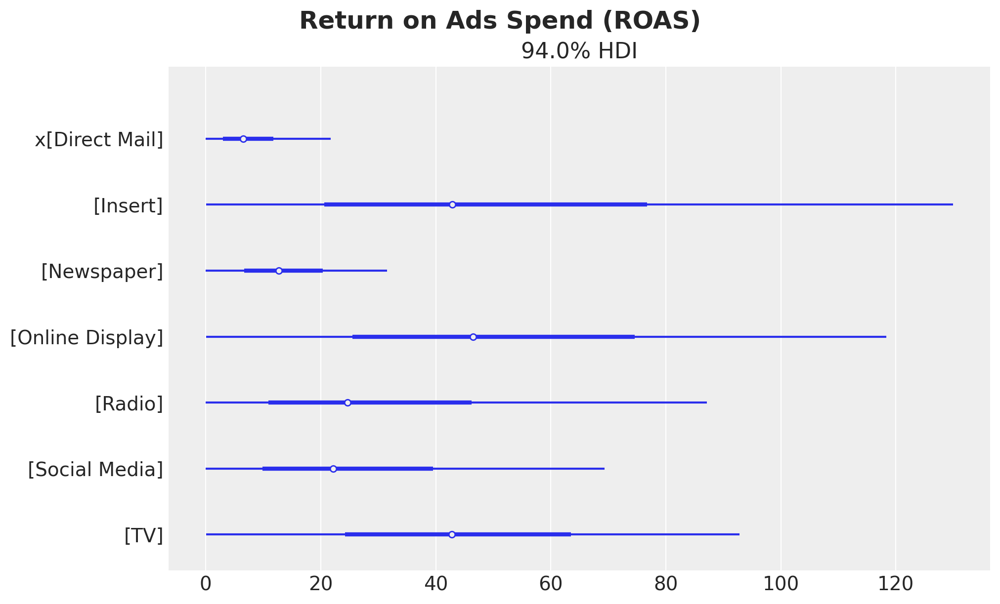

In [30]:
# Get the channel contributions on the original scale
channel_contribution_original_scale = mmm.compute_channel_contribution_original_scale()

# Sum the contributions over the whole training period
spend_sum = X_train[channel_columns].sum().to_numpy()
spend_sum = spend_sum[
    np.newaxis, np.newaxis, :
]  # We need these extra dimensions to broadcast the spend sum to the shape of the contributions.

# Compute the ROAS as the ratio of the mean contribution and the spend for each channel
roas_samples = channel_contribution_original_scale.sum(dim="date") / spend_sum

# Plot the ROAS
fig, ax = plt.subplots(figsize=(10, 6))
az.plot_forest(roas_samples, combined=True, ax=ax)
fig.suptitle("Return on Ads Spend (ROAS)", fontsize=18, fontweight="bold")

[Text(0.5, 1.0, 'Channel Contribution Share vs ROAS'),
 Text(0.5, 0, 'Contribution Share'),
 Text(0, 0.5, 'ROAS')]

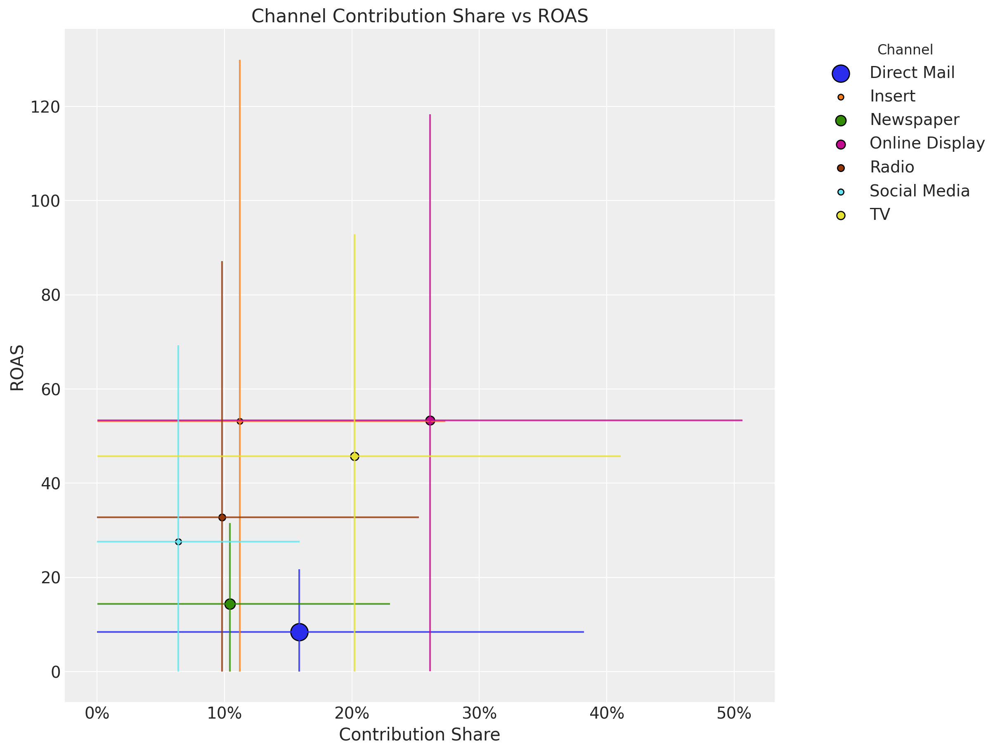

In [32]:
# Get the contribution share samples
share_samples = mmm.get_channel_contributions_share_samples()

fig, ax = plt.subplots(figsize=(12, 9))

for i, channel in enumerate(channel_columns):
    # Contribution share mean and hdi
    share_mean = share_samples.sel(channel=channel).mean().to_numpy()
    share_hdi = az.hdi(share_samples.sel(channel=channel))["x"].to_numpy()

    # ROAS mean and hdi
    roas_mean = roas_samples.sel(channel=channel).mean().to_numpy()
    roas_hdi = az.hdi(roas_samples.sel(channel=channel))["x"].to_numpy()

    # Plot the contribution share hdi
    ax.vlines(share_mean, roas_hdi[0], roas_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the ROAS hdi
    ax.hlines(roas_mean, share_hdi[0], share_hdi[1], color=f"C{i}", alpha=0.8)

    # Plot the means
    ax.scatter(
        share_mean,
        roas_mean,
        # Size of the scatter points is proportional to the spend share
        s=5 * (spend_shares[i] * 100),
        color=f"C{i}",
        edgecolor="black",
        label=channel,
    )
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))

ax.legend(
    bbox_to_anchor=(1.05, 1), loc="upper left", title="Channel", title_fontsize=12
)
ax.set(
    title="Channel Contribution Share vs ROAS",
    xlabel="Contribution Share",
    ylabel="ROAS",
)

In [33]:
y_pred_test = mmm.sample_posterior_predictive(
    X_test,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contributions"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


[Text(0, 0.5, 'sales')]

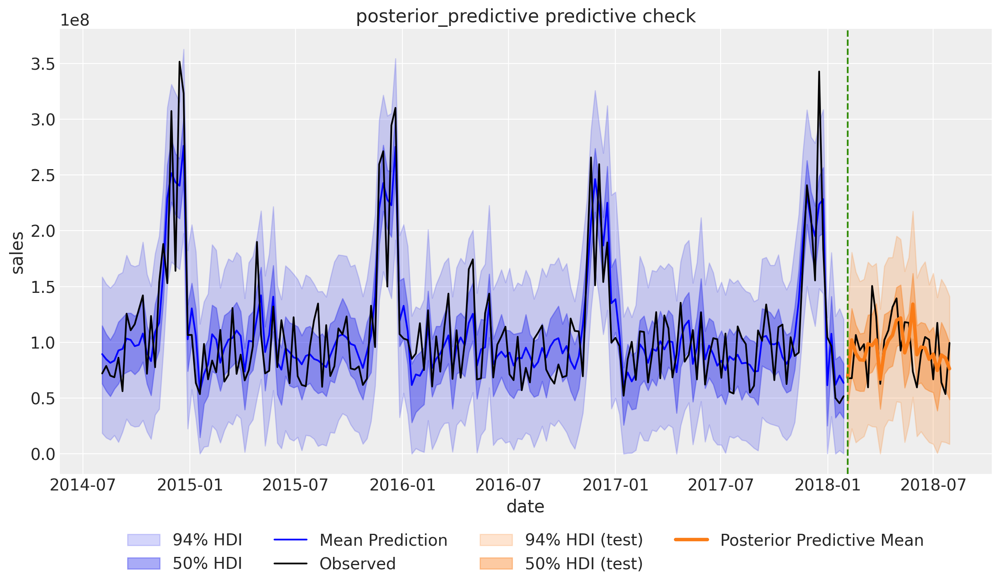

In [34]:
fig, ax = plt.subplots()
mmm.plot_posterior_predictive(original_scale=True, ax=ax)

test_hdi_94 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.94)
test_hdi_50 = az.hdi(y_pred_test["y"].to_numpy().T, hdi_prob=0.50)

ax.fill_between(
    X_test[date_column],
    test_hdi_94[:, 0],
    test_hdi_94[:, 1],
    color="C1",
    label=f"{0.94:.0%} HDI (test)",
    alpha=0.2,
)

ax.fill_between(
    X_test[date_column],
    test_hdi_50[:, 0],
    test_hdi_50[:, 1],
    color="C1",
    label=f"{0.50:.0%} HDI (test)",
    alpha=0.4,
)

ax.plot(X_test[date_column], y_test, color="black")
ax.plot(
    X_test[date_column],
    y_pred_test["y"].mean(dim="sample"),
    color="C1",
    linewidth=3,
    label="Posterior Predictive Mean",
)
ax.axvline(X_test[date_column].iloc[0], color="C2", linestyle="--")
ax.legend(loc="upper center", bbox_to_anchor=(0.5, -0.1), ncol=4)
ax.set(ylabel="sales")

In [35]:
X_test[channel_columns].sum(axis=0)

Direct Mail       12107275.13
Insert             1065383.05
Newspaper           273433.16
Online Display     6498301.30
Radio              3384098.82
Social Media       4298913.23
TV                 2610543.53
dtype: float64

In [36]:
num_periods = X_test[date_column].shape[0]

# Total budget for the test set per channel
all_budget_per_channel = X_test[channel_columns].sum(axis=0)

# Total budget for the test set
all_budget = all_budget_per_channel.sum()

# Weekly budget for each channel
# We are assuming we do not know the total budget allocation in advance
# so this would be the naive "uniform" allocation.
per_channel_weekly_budget = all_budget / (num_periods * len(channel_columns))

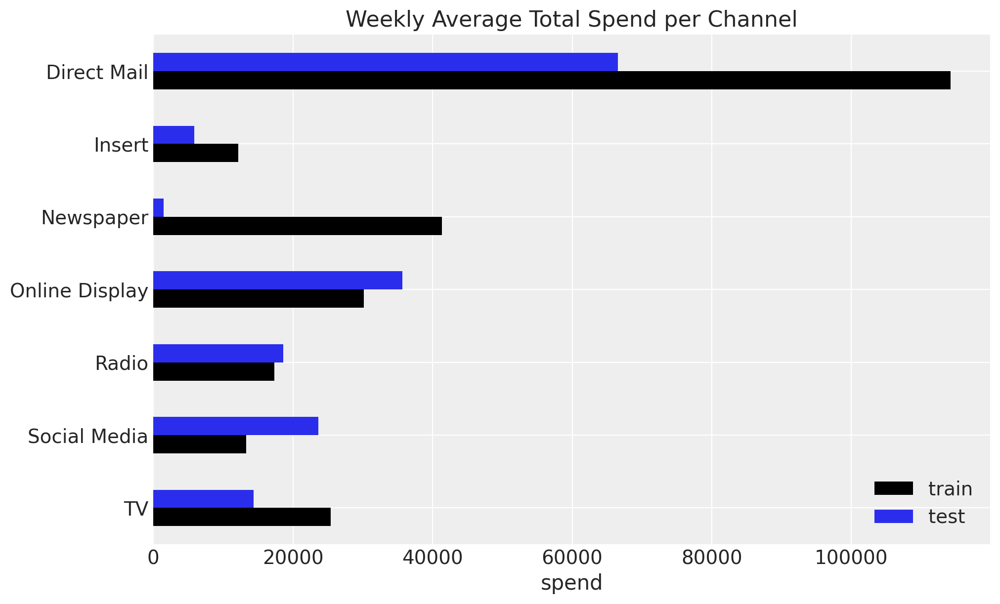

In [40]:
average_spend_per_channel_train = X_train[channel_columns].sum(axis=0) / (
    X_train.shape[0] * len(channel_columns)
)

average_spend_per_channel_test = X_test[channel_columns].sum(axis=0) / (
    X_test.shape[0] * len(channel_columns)
)

fig, ax = plt.subplots(figsize=(10, 6))
average_spend_per_channel_train.to_frame(name="train").join(
    other=average_spend_per_channel_test.to_frame(name="test"),
    how="inner",
).sort_index(ascending=False).plot.barh(color=["black", "C0"], ax=ax)
ax.set(title="Weekly Average Total Spend per Channel", xlabel="spend");

In [41]:
percentage_change = 0.5

mean_spend_per_period_test = (
    X_test[channel_columns].sum(axis=0).div(num_periods * len(channel_columns))
)

budget_bounds = {
    key: [(1 - percentage_change) * value, (1 + percentage_change) * value]
    for key, value in (mean_spend_per_period_test).to_dict().items()
}

In [42]:
budget_bounds

{'Direct Mail': [33261.744862637366, 99785.2345879121],
 'Insert': [2926.876510989011, 8780.629532967032],
 'Newspaper': [751.1899999999999, 2253.5699999999997],
 'Online Display': [17852.476098901097, 53557.42829670329],
 'Radio': [9296.974780219782, 27890.924340659345],
 'Social Media': [11810.201181318682, 35430.603543956044],
 'TV': [7171.822884615385, 21515.468653846154]}

In [76]:
model_granularity = "weekly"
allocation_strategy, optimization_result = mmm.optimize_budget(
    budget=per_channel_weekly_budget*1.5,
    num_periods=num_periods,
    budget_bounds=budget_bounds,
    minimize_kwargs={
        "method": "SLSQP",
        "options": {"ftol": 1e-9, "maxiter": 5_000},
    },
)

response = mmm.sample_response_distribution(
    allocation_strategy=allocation_strategy,
    time_granularity=model_granularity,
    num_periods=num_periods,
    noise_level=0.05,
)

/Users/scott.mckean/Repos/media-mix-modeling/.venv/lib/python3.12/site-packages/pymc_marketing/mmm/budget_optimizer.py:215: UserWarning: Using default equality constraint
  self.set_constraints(
Sampling: [y]


[Text(0.5, 1.0, 'Budget Allocation Comparison'), Text(0.5, 0, 'allocation')]

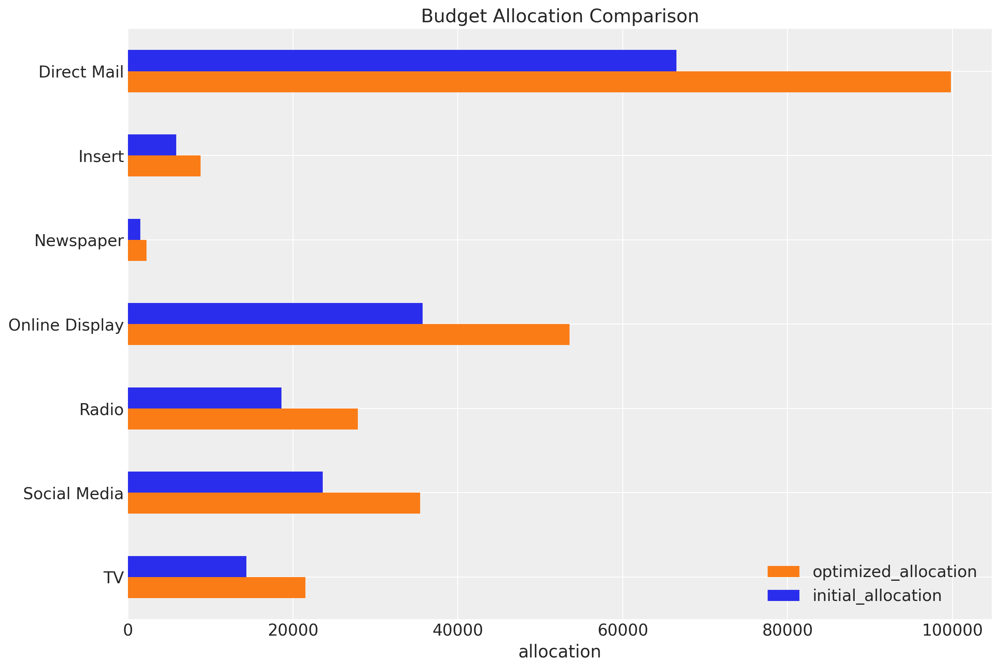

In [77]:
fig, ax = plt.subplots()

(
    pd.Series(allocation_strategy, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
    .plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
)
ax.set(title="Budget Allocation Comparison", xlabel="allocation")

In [78]:
X_actual_uniform = X_test.copy()

for channel in channel_columns:
    X_actual_uniform[channel] = mean_spend_per_period_test[channel]

for control in control_columns:
    X_actual_uniform[control] = 0.0

pred_test_uniform = mmm.sample_posterior_predictive(
    X_actual_uniform,
    include_last_observations=True,
    original_scale=True,
    var_names=["y", "channel_contributions"],
    extend_idata=False,
    progressbar=False,
    random_seed=rng,
)

Sampling: [y]


[Text(0.5, 1.0, 'Out-of-Sample Predictions - Optimized Budget Allocation'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'sales')]

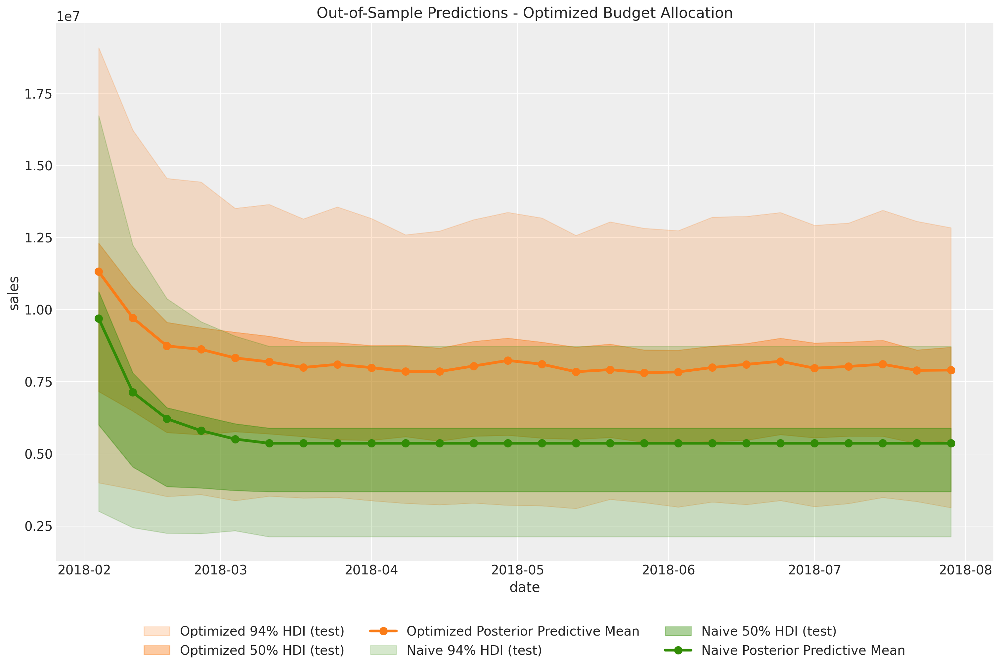

In [80]:
response_channel_contribution_original_scale = apply_sklearn_transformer_across_dim(
    data=response["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)


fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    response_channel_contribution_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    response_channel_contribution_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["channel_contributions"]
    .unstack()
    .sum(dim="channel")
    .transpose(..., "date")
    .mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
)

[Text(0.5, 1.0, 'Channel Contributions\nDifference between optimized and initial allocation')]

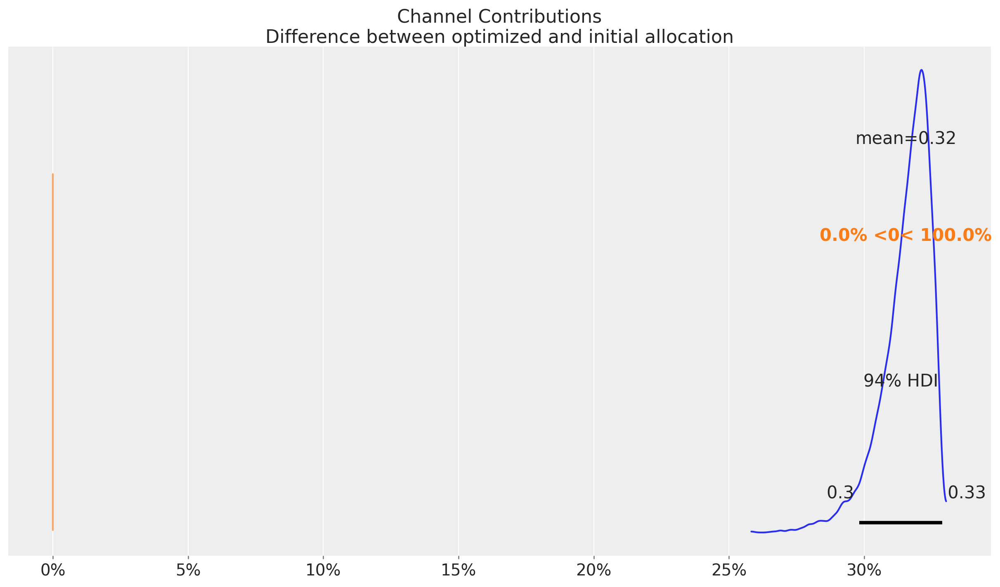

In [81]:
fig, ax = plt.subplots()
az.plot_posterior(
    (
        response_channel_contribution_original_scale.sum(dim="date")
        - pred_test_uniform["channel_contributions"]
        .unstack()
        .sum(dim="channel")
        .transpose(..., "date")
        .sum(dim="date")
    )
    / response_channel_contribution_original_scale.sum(dim="date"),
    ref_val=0,
    ax=ax,
)
ax.xaxis.set_major_formatter(plt.FuncFormatter(lambda x, _: f"{x:.0%}"))
ax.set(
    title="Channel Contributions\nDifference between optimized and initial allocation"
)

[Text(0.5, 1.0, 'Out-of-Sample Predictions - Optimized Budget Allocation'),
 Text(0.5, 0, 'date'),
 Text(0, 0.5, 'sales')]

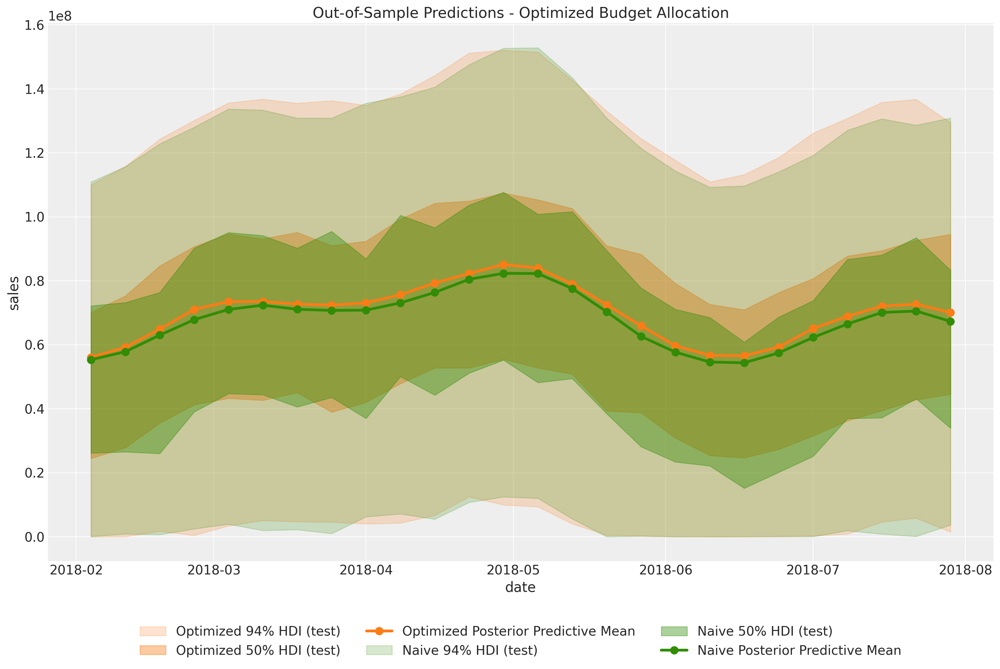

In [82]:
y_response_original_scale = apply_sklearn_transformer_across_dim(
    data=response["y"].unstack().transpose(..., "date"),
    func=mmm.get_target_transformer().inverse_transform,
    dim_name="date",
)

fig, ax = plt.subplots(figsize=(15, 10))

az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.94,
    color="C1",
    fill_kwargs={"alpha": 0.2, "label": f"Optimized {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_test[date_column],
    y_response_original_scale,
    hdi_prob=0.5,
    color="C1",
    fill_kwargs={"alpha": 0.4, "label": f"Optimized {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_test[date_column],
    y_response_original_scale.mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C1",
    linewidth=3,
    label="Optimized Posterior Predictive Mean",
)

az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.94,
    color="C2",
    fill_kwargs={"alpha": 0.2, "label": f"Naive {0.94:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
az.plot_hdi(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date"),
    hdi_prob=0.5,
    color="C2",
    fill_kwargs={"alpha": 0.4, "label": f"Naive {0.50:.0%} HDI (test)"},
    smooth=False,
    ax=ax,
)
ax.plot(
    X_actual_uniform[date_column],
    pred_test_uniform["y"].unstack().transpose(..., "date").mean(dim=("chain", "draw")),
    marker="o",
    markersize=8,
    color="C2",
    linewidth=3,
    label="Naive Posterior Predictive Mean",
)

ax.legend(loc="lower center", bbox_to_anchor=(0.5, -0.20), ncol=3)

ax.set(
    title="Out-of-Sample Predictions - Optimized Budget Allocation",
    xlabel="date",
    ylabel="sales",
)

In [87]:
import pymc_marketing.mlflow

pymc_marketing.mlflow.log_mmm(mmm)

2025/04/02 09:15:47 WARNING mlflow.models.model: Model logged without a signature and input example. Please set `input_example` parameter when logging the model to auto infer the model signature.


[Text(0.5, 1.0, 'Budget Allocation Comparison'), Text(0.5, 0, 'allocation')]

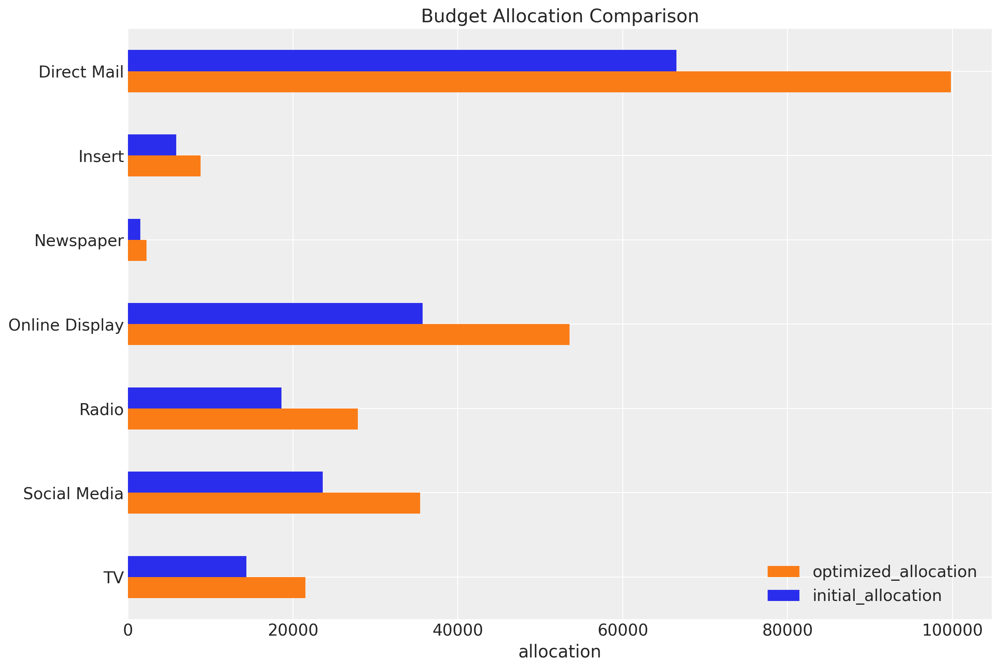

In [84]:
fig, ax = plt.subplots()

(
    pd.Series(allocation_strategy, index=mean_spend_per_period_test.index)
    .to_frame(name="optimized_allocation")
    .join(mean_spend_per_period_test.to_frame(name="initial_allocation"))
    .sort_index(ascending=False)
    .plot.barh(figsize=(12, 8), color=["C1", "C0"], ax=ax)
)
ax.set(title="Budget Allocation Comparison", xlabel="allocation")

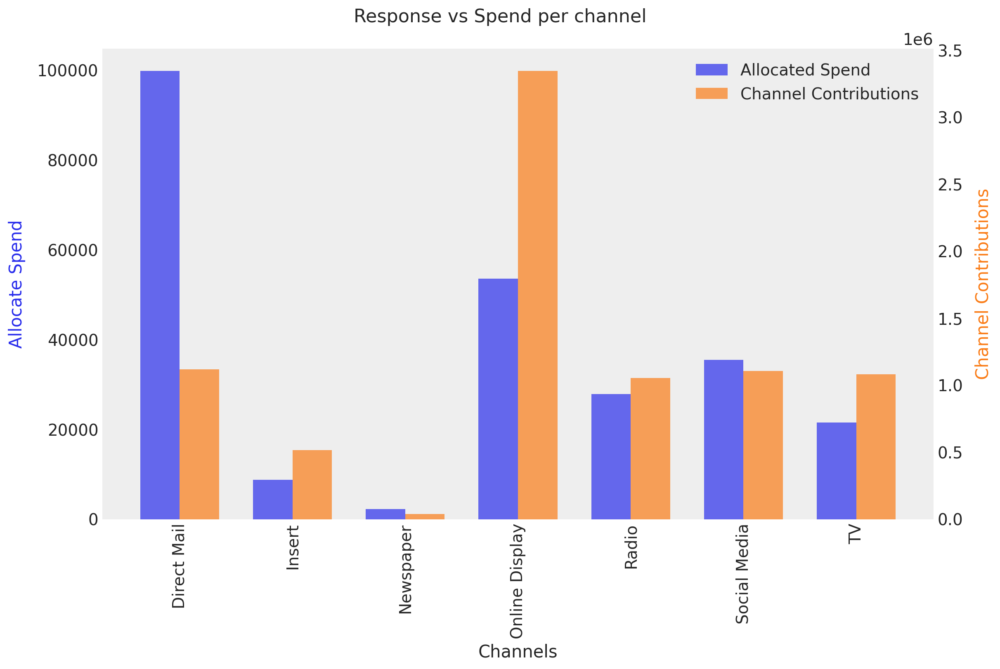

In [85]:
fig, ax = mmm.plot_budget_allocation(samples=response, figsize=(12, 8))
fig.suptitle("Response vs Spend per channel", fontsize=16);